In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import torch
import numpy as np

from PIL import Image, ImageDraw
from matplotlib import pyplot as plt
from dataset_utils import parse_annotation, modify_annotation
from AugmenterPipeline import augmenter

/home/jovyan/.mlspace/envs/ddorin/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/jovyan/.mlspace/envs/ddorin/lib/python3.12/site-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)


## Dataset VOC2007
All 20 classes in data:

| Object Class | Object Class | Object Class | Object Class | Object Class |
| ------------ | ------------ | ------------ | ------------ | ------------ |
| Aeroplane    | Bicycle      | Bird         | Boat         | Bottle       |
| Bus          | Car          | Cat          | Chair        | Cow          |
| Dining table | Dog          | Horse        | Motorbike    | Person       |
| Potted plant | Sheep        | Sofa         | Train        | TV/monitor   |


| Object | Mapped To |
| --- | --- |
| cow | sheep, horse |
| sheep | cow, horse |
| horse | cow, sheep |
| bicycle | motorbike |
| motorbike | bicycle |
| cat | dog |
| car | bicycle |
| person | potted plant |
| bird | cat |

In [3]:
object_classes = [
    "bicycle", "aeroplane", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow",
    "dining table", "dog", "horse", "motorbike", "person",
    "potted plant", "sheep", "sofa", "train", "tvmonitor"]

In [4]:
data_path = '/home/jovyan/ddorin/generative_augmentation/augmenter_pipeline/VOC2007'
annotation_path = data_path + '/Annotations/000120.xml'
image_filename, anns = parse_annotation(annotation_path)
image_filename = image_filename.rsplit('.', 1)[0]

In [5]:
anns

{'dog': [(<PIL.Image.Image image mode=L size=500x400>, 0)]}

In [6]:
image_filename

'000120'

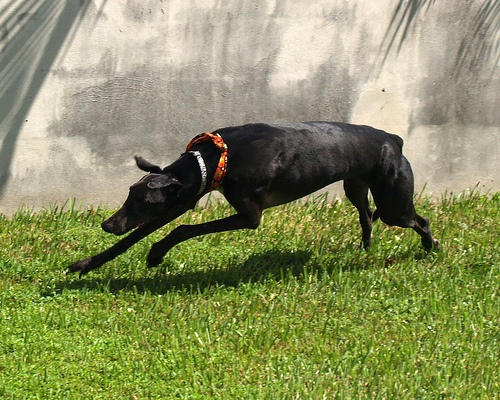

In [7]:
current_object = 'dog'
mask, ind = anns[current_object][0]
image = Image.open(data_path + '/JPEGImages/' + image_filename +'.jpg')
image
#mask

## Creating an augmented dataset

### Pipeline for augmentation

In [8]:
model = augmenter()

Loading checkpoint shards: 100%|██████████| 2/2 [00:12<00:00,  6.14s/it]
/home/jovyan/.mlspace/envs/ddorin/lib/python3.12/site-packages/transformers/models/llava/configuration_llava.py:100: FutureWarning: The `vocab_size` argument is deprecated and will be removed in v4.42, since it can be inferred from the `text_config`. Passing this argument has no effect
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 3/3 [00:12<00:00,  4.32s/it]
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
safety_checker/model.safetensors not found
Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]An error occurred while trying to fetch /home/jovyan/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/51388a731f57604945fddd703ecb5c50e8e7b49d/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/jovyan/.cache/huggingface/hub/models--runwayml--stable-diffu

06/24 15:16:38 - mmengine - INFO - Successfully add external embeddings: P_ctxt, P_shape, P_obj.
06/24 15:16:38 - mmengine - INFO - Successfully add trainable external embeddings: P_ctxt, P_shape, P_obj


In [13]:
#object_classes
new_image, new_object, prompt = model(pil_image=image,
                                                pil_mask=mask,
                                                current_object=current_object,
                                                new_objects_list=None,
                                                num_inference_steps=200,
                                                guidance_scale=5.2,
                                                return_prompt=True)

100%|██████████| 200/200 [00:06<00:00, 32.60it/s]


### Examples of generation

New object: horse, prompt: A majestic, sturdy equine creature with powerful legs, boasting a glistening brown coat accented by white markings on its face, and shining amber eyes gazing intently at its surroundings – a horse.



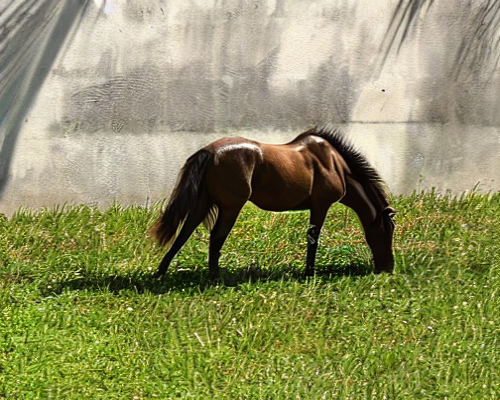

In [14]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: playfulrabbit, prompt: A mischievous rabbit with fluffy ears, long whiskers, and velvety fur coat bounces around in its natural habitat, showcasing a lively personality and vibrant colors. The rabbit.



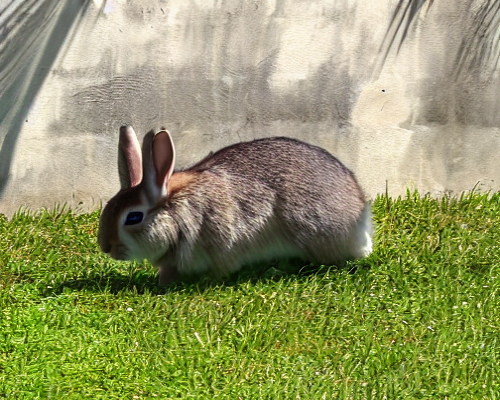

In [74]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: cat, prompt: The sleek, striped feline with its warm brown fur, alert emerald-green eyes, and pointy ears, rests gracefully on its sturdy paws. Cat.



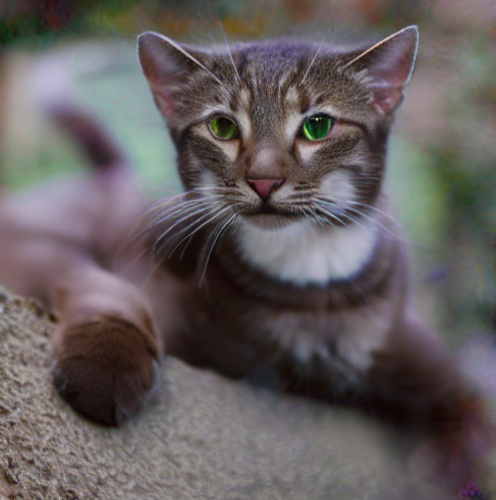

In [58]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: bottle, prompt: This elongated glass vessel, with its slender cylindrical shape, holds liquid within its slightly curved neck, revealing hues of various colors dancing across its transparent surface as light passes through, culminating into a beautiful, tapered bottom adorning the object we know as "bottle."



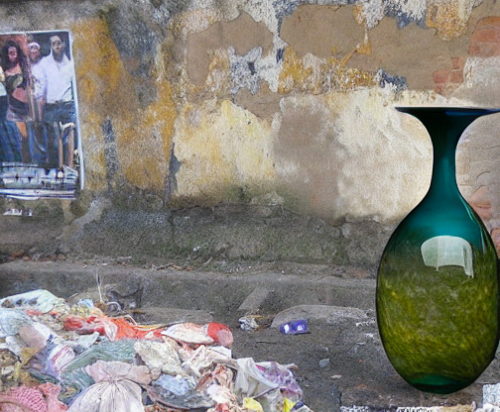

In [24]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: cat, prompt: a small, soft-furred creature with curved ears, a slim body, and long tail ending in rounded tip; a feline friend; cat.



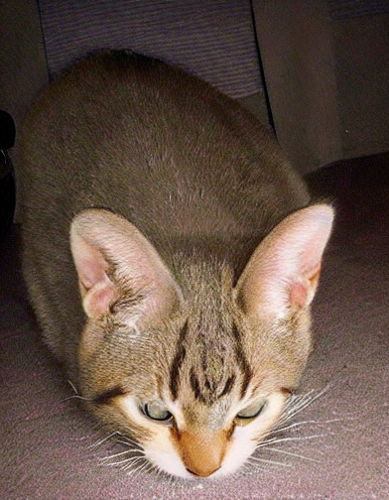

In [54]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: cat, prompt: a sleek, furry feline with soft, wavy whiskers, rounded ears, a curious, expressive face, and agile, graceful limbs - cat



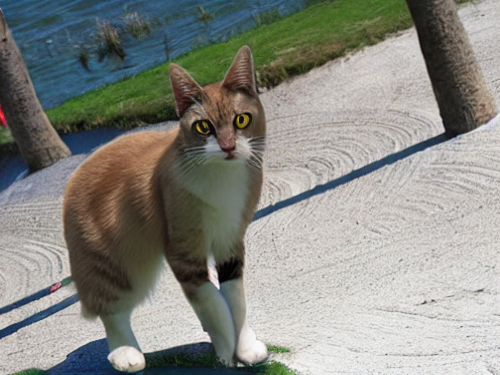

In [47]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: chair, prompt: a sturdy, well-crafted seat with a comfortable backrest and smooth wooden legs forming a solid support system - chair



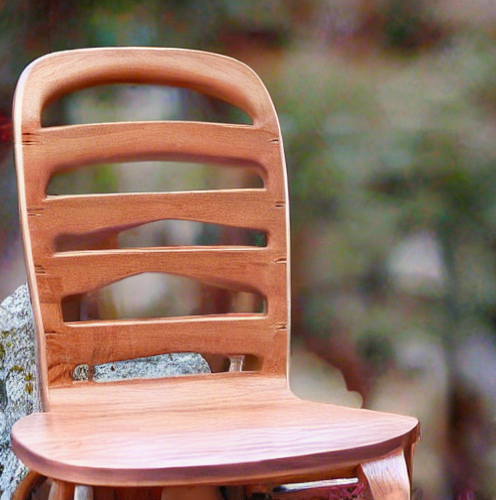

In [172]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: pottedplant, prompt: a lively, green-leaved, compact arrangement in a modest terracotta container



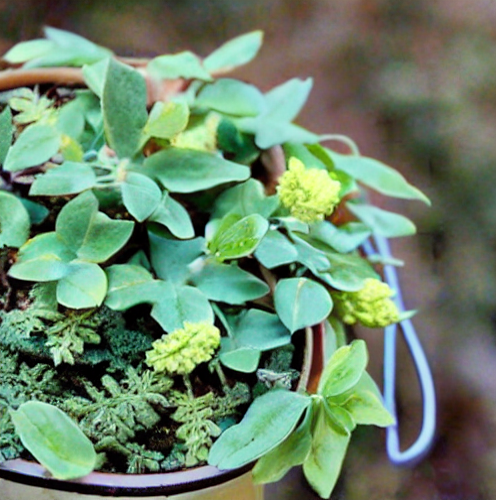

In [169]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: pottedplant, prompt: a lively, green-hued arrangement in a round pot with a sturdy stem supporting multiple branches bearing vibrant leaves



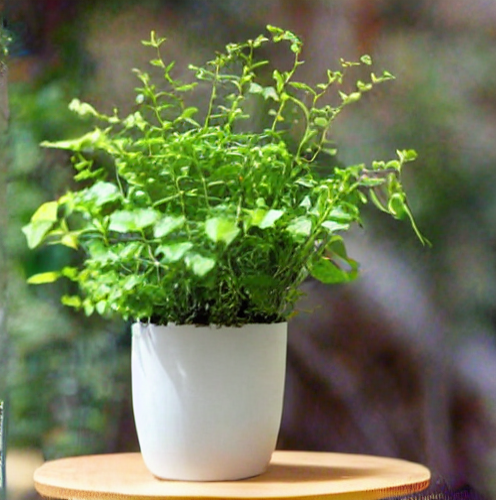

In [155]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: cat, prompt: a cat appears soft, warm-colored with gentle movements, fluffy tail, and alert, inquisitive eyes. Cat.



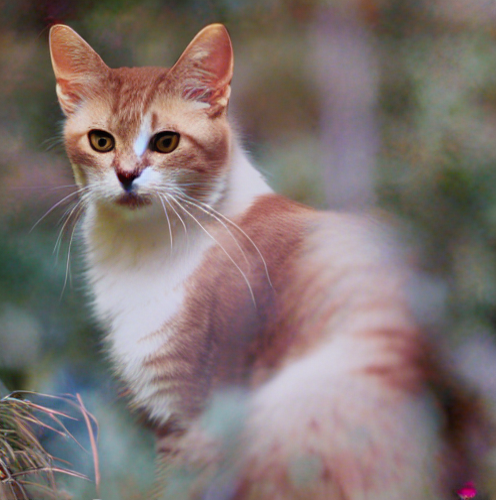

In [144]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: bird, prompt: a small, graceful creature with soft feathers in various colors, featuring long beak and slender legs - bird.



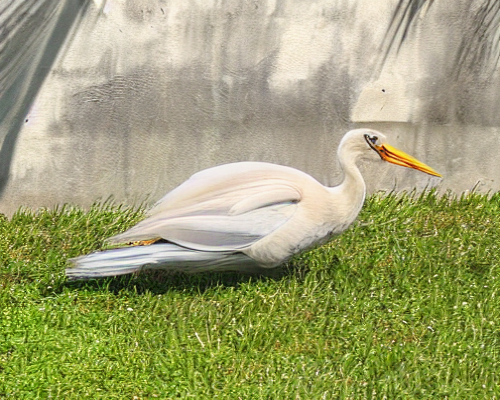

In [85]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: rabbit, prompt: a small fluffy creature with long curved ears and compact body featuring soft, delicate fur. Rabbit.



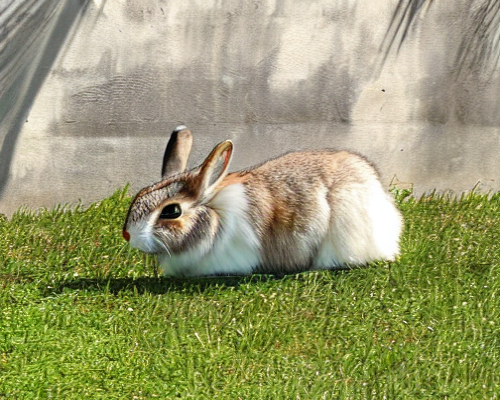

In [46]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: a fox, prompt: a captivating creature with golden fur, piercing eyes, pointy ears, graceful tail, and slender body. Fox



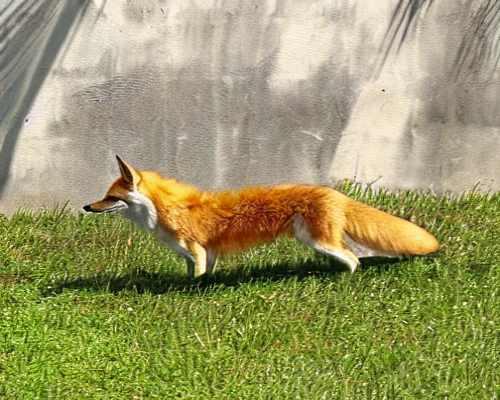

In [28]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: a chair, prompt: a solid construction, featuring smooth wooden surfaces with subtle variations in color, sturdy legs, and a comfortable seat made from plush upholstery providing soft support; chair.



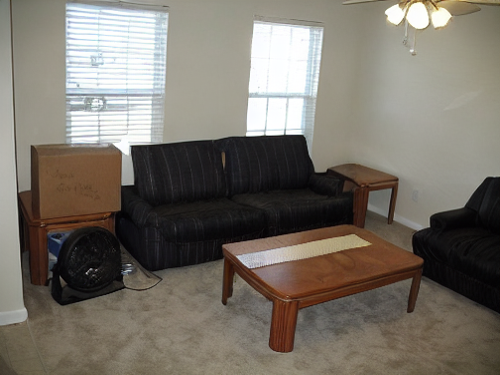

In [389]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: 'chair', prompt: a simple yet solid furniture piece with four legs connecting a horizontal seat and vertical backrest, creating a comfy resting area - chair



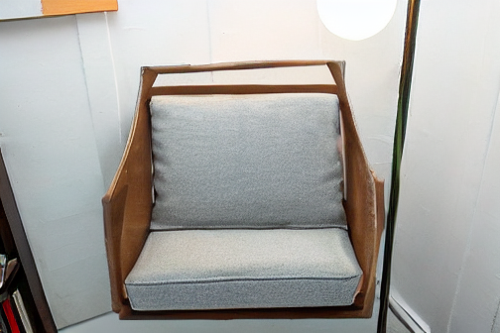

In [341]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: a cat, prompt: a graceful feline with a velvety fur coat, its agile body shaped by fluid curves, showcasing an elegant gait. Cat



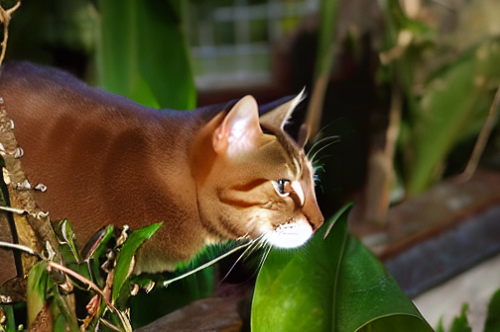

In [295]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: a squirrel, prompt: a small, agile creature with a bushy tail covered in brown fur, having bright, curious eyes, appearing nimble and playful as it moves. Squirrel



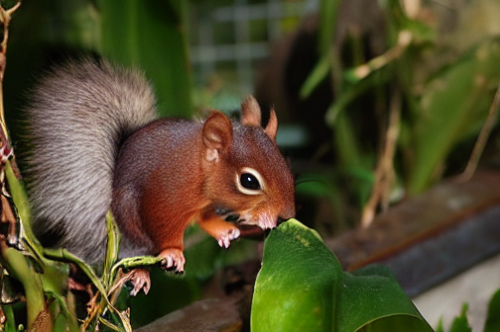

In [289]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: a butterfly, prompt: a graceful, colorful creature with vibrant wings featuring numerous intricate patterns; it's also very delicate and has an enchanting presence - a butterfly.



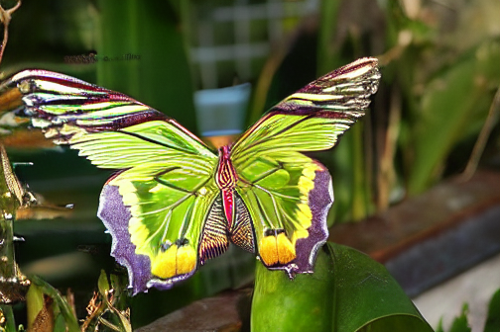

In [281]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: a cat, prompt: a small, furry creature with pointed ears, big soulful eyes, and a graceful, slender body. Cat



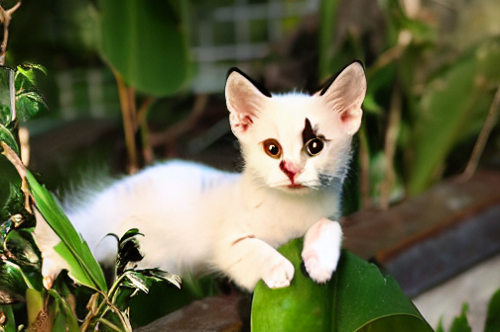

In [278]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: boat, prompt: a large vessel, sturdy and durable, having a flat base for floating, with a rounded hull, displaying graceful curves as it glides through water; boat.



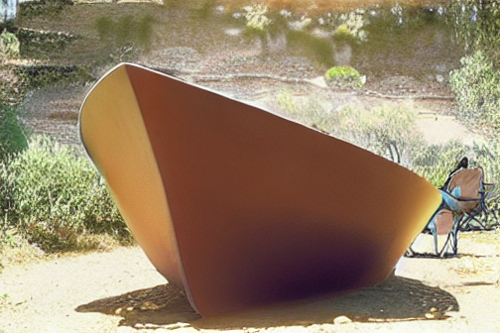

In [112]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: a motorcycle, prompt: a compact, sleek machine with smooth curves, shiny surface, gleaming wheels, and powerful stance - motorcycle.



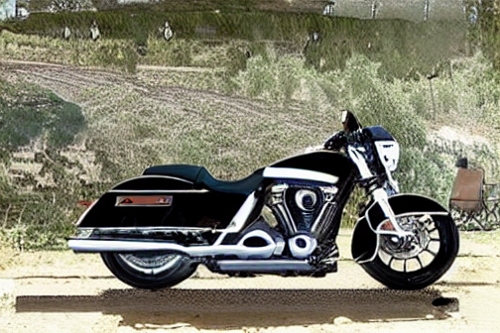

In [108]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

New object: a bicycle, prompt: a sturdy machine with two equal-sized wheels, metal frame holding handlebars, and pedals beneath for smooth movement; it's designed for effortless riding on diverse terrains. Bicycle.



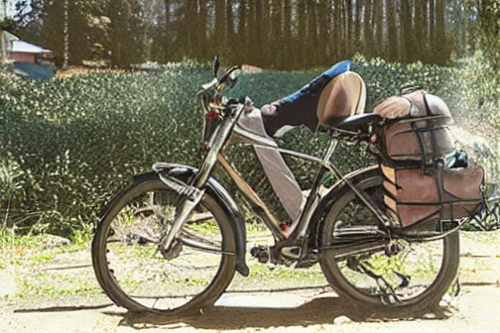

In [81]:
print(f'New object: {new_object}, prompt: {prompt}\n')
new_image

In [15]:
new_image.save('./VOC_demo/'+image_filename+'.jpg')

### Rewrite annotations

In [ ]:
for file_name in xml_files:
    with get_local_path(file_name) as local_path:
        raw_ann_info = ET.parse(local_path)

    object_detect = raw_ann_info.findall('object')[obj2remove]
    if object_detect.findall('name')[0].text in mapping:
        prompt = mapping[object_detect.findall('name')[0].text][0]
        negative_prompt = object_detect.findall('name')[0].text
        object_detect.findall('name')[0].text = prompt

        raw_ann_info.findall('filename')[0].text = f'replaced_{mask_dataset.files[i]}_{j}.xml'

        raw_ann_info.write(os.path.join(DATA_PATH, f'VOCdevkit/VOC2012/Annotations/replaced/replaced_{mask_dataset.files[i]}_{j}.xml'), encoding='utf8', xml_declaration=True)

        image = ToPILImage()(elem[0])
        mask_remove = ToPILImage()((elem[1] == (obj2remove + 1)).float()).filter(ImageFilter.MaxFilter(11))

        input_image = {'image': image, 'mask': mask_remove}
        size_image = image.size

        res = predict(
                pipe,
                input_image,
                prompt,
                fitting_degree,
                ddim_steps, scale,
                seed,
                negative_prompt,
                task,
                None,
                None
        )
        result = res[0][1].resize(size_image)
        result.save(os.path.join(DATA_PATH, f'VOCdevkit/VOC2012/JPEGImages/replaced/replaced_{mask_dataset.files[i]}_{j}.jpg'))